# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [8]:
'''%pip install google-colab

from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip'''

"%pip install google-colab\n\nfrom google.colab import drive\ndrive.mount('/content/drive')\n\n!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./\n!unzip dataset.zip"

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# TRACK A 

In [ ]:
import cv2
import numpy as np
from pathlib import Path
from concurrent.futures import ThreadPoolExecutor
import matplotlib.pyplot as plt
import time

In [ ]:
class MatchTracker:
    def __init__(self, image_shape):
        self.matches = {}
        self.masked_regions = np.zeros(image_shape, dtype=np.uint8)
        self.centers = []
    
    def check_overlap(self, center, width, height):
        """More lenient overlap check"""
        for existing_center in self.centers:
            dist = np.linalg.norm(np.array(center) - np.array(existing_center))
            max_dist = min(width, height) * 0.35  # More lenient
            if dist < max_dist:
                return True
        return False

    def add_match(self, product_id, detection):
        """Add a new match and update mask """
        if not self.check_overlap(detection['position'], detection['width'], detection['height']):
            if product_id not in self.matches or detection['confidence'] > self.matches[product_id]['confidence']:
                self.matches[product_id] = detection
                self.centers.append(detection['position'])
                self._update_mask(detection['corners'])

    def _update_mask(self, corners):
        cv2.fillPoly(self.masked_regions, [np.int32(corners)], 255)

In [ ]:
def preprocess_scene(img):
    """Simple preprocessing for noisy scenes"""
    img = cv2.medianBlur(img, 9)
    img = cv2.bilateralFilter(img, d=-1, sigmaColor=25, sigmaSpace=15)
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def preprocess_model(img, size=(400, 400)):
    """Minimal preprocessing for reference images"""
    if size and (img.shape[1] != size[0] or img.shape[0] != size[1]):
        img = cv2.resize(img, size)
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [ ]:
def detect_single_product(model_img, scene_img, model_name, mask=None):
    """Detect single product with final parameter tuning"""
    # Preprocess images
    model_processed = preprocess_model(model_img)
    scene_processed = preprocess_scene(scene_img)
    
    if mask is not None:
        scene_processed = cv2.bitwise_and(scene_processed, scene_processed, mask=255-mask)
    
    # Final tuned SIFT parameters
    sift = cv2.SIFT_create(
        nfeatures=10000,
        nOctaveLayers=6,
        contrastThreshold=0.012,  # Slightly lower
        edgeThreshold=13  # Slightly lower
    )
    
    kp1, des1 = sift.detectAndCompute(model_processed, None)
    kp2, des2 = sift.detectAndCompute(scene_processed, None)
    
    if des1 is None or des2 is None or len(kp1) < 10 or len(kp2) < 10:
        return None
    
    # Match features with adjusted parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=3)  # Increased trees
    search_params = dict(checks=300)  # More checks
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    try:
        matches = flann.knnMatch(des1, des2, k=2)
    except:
        return None
    
    # More lenient matching for initial detection
    good_matches = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:  # Slightly more lenient
            good_matches.append(m)
    
    if len(good_matches) < 11:  # Lower threshold
        return None
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    
    # Adjusted RANSAC parameters
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.0)
    
    if H is None:
        return None
    
    h, w = model_processed.shape
    corners = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
    transformed_corners = cv2.perspectiveTransform(corners, H)
    
    # Calculate dimensions with final size adjustment
    center_x = np.mean([corner[0][0] for corner in transformed_corners])
    center_y = np.mean([corner[0][1] for corner in transformed_corners])
    width = max([abs(corner[0][0] - center_x) for corner in transformed_corners])
    height = max([abs(corner[0][1] - center_y) for corner in transformed_corners])
    
    # Adjusted size validation
    if width < 40 or height < 40:  # Lower minimum size
        return None
    
    if width * height > scene_img.shape[0] * scene_img.shape[1] * 0.8:
        return None
    
    # Dynamic confidence threshold
    confidence = np.sum(mask) / len(good_matches) if mask is not None else 0
    min_confidence = 0.30  # Lower base threshold
    
    if width * height > 400000:  # Size-based threshold adjustment
        min_confidence = 0.33
    elif width * height < 100000:
        min_confidence = 0.28
    
    if confidence < min_confidence:
        return None
    
    return {
        'model_name': model_name,
        'position': (int(center_x), int(center_y)),
        'width': int(width * 1.05),  # Slight size increase
        'height': int(height * 1.05),  # Slight size increase
        'corners': transformed_corners,
        'confidence': confidence,
        'num_matches': len(good_matches),
        'num_inliers': np.sum(mask) if mask is not None else 0
    }

In [ ]:
def detect_products(models_path, scenes_path):
    """Main detection function with improved validation"""
    # Load images
    models = {}
    for img_path in sorted(Path(models_path).glob("*.png"), 
                         key=lambda x: int(x.stem.replace("ref", ""))):
        models[img_path.stem] = cv2.imread(str(img_path))
    
    scenes = {}
    for img_path in sorted(Path(scenes_path).glob("*.png"), 
                         key=lambda x: int(x.stem.replace("scene", ""))):
        scenes[img_path.stem] = cv2.imread(str(img_path))
    
    results = {}
    
    # Process each scene
    for scene_name, scene_img in scenes.items():
        print(f"\nProcessing {scene_name}...")
        tracker = MatchTracker(scene_img.shape[:2])
        
        # Two detection passes with improved tracking
        for pass_num in range(2):
            for model_name, model_img in models.items():
                detection = detect_single_product(
                    model_img, 
                    scene_img, 
                    model_name,
                    tracker.masked_regions if pass_num == 1 else None
                )
                
                if detection:
                    tracker.add_match(model_name, detection)
        
        results[scene_name] = tracker.matches
        print(f"Completed {scene_name}. Found {len(tracker.matches)} products.")
    
    return results

In [ ]:
def visualize_detection(scene_img, detection):
    """Visualize single detection with color-coded confidence"""
    img = scene_img.copy()
    corners = np.int32(detection['corners'])
    
    # Color-coded confidence
    confidence = detection['confidence']
    color = (
        int(255 * (1 - confidence)),  # Red increases with low confidence
        int(255 * confidence),        # Green increases with high confidence
        0
    )
    
    # Draw box
    cv2.polylines(img, [corners], True, color, 6)
    
    # Draw center
    center = detection['position']
    cv2.circle(img, center, 5, color, -1)
    
    # Add text
    text = f"{detection['model_name']} ({confidence:.2f})"
    cv2.putText(img, text, (center[0], center[1] - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return img

def plot_results(results, scenes_path):
    """Plot all results"""
    for scene_name, detections in results.items():
        # Read scene image
        scene_img = cv2.imread(f"{scenes_path}/{scene_name}.png")
        img = scene_img.copy()
        
        # Apply all detections
        for detection in detections.values():
            img = visualize_detection(img, detection)
        
        # Convert BGR to RGB for matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Create figure
        plt.figure(figsize=(15, 10))
        plt.imshow(img_rgb)
        plt.title(f"Results for {scene_name}")
        plt.axis('off')
        
        # Print detection details
        print(f"\nResults for {scene_name}:")
        for detection in detections.values():
            print(f"Product {detection['model_name']} - 1 instance found:")
            print(f"  Instance 1 {{position: {detection['position']}, "
                  f"width: {detection['width']}px, "
                  f"height: {detection['height']}px}}")
            print(f"  Matches: {detection['num_inliers']}/{detection['num_matches']}")
        
        plt.show()

In [ ]:
def run_detection(dataset_path):
    """Run the complete detection pipeline"""
    models_path = f"{dataset_path}/models"
    scenes_path = f"{dataset_path}/scenes"
    
    # Run detection
    print("Starting product detection...")
    results = detect_products(models_path, scenes_path)
    
    # Plot results
    print("\nPlotting results...")
    plot_results(results, scenes_path)
    
    return results

Starting product detection...

Processing scene1...
Completed scene1. Found 2 products.

Processing scene2...
Completed scene2. Found 2 products.

Processing scene3...
Completed scene3. Found 3 products.

Processing scene4...
Completed scene4. Found 2 products.

Processing scene5...
Completed scene5. Found 2 products.

Plotting results...

Results for scene1:
Product ref1 - 1 instance found:
  Instance 1 {position: (409, 536), width: 424px, height: 553px}
  Matches: 376/630
Product ref2 - 1 instance found:
  Instance 1 {position: (1249, 535), width: 423px, height: 551px}
  Matches: 292/519


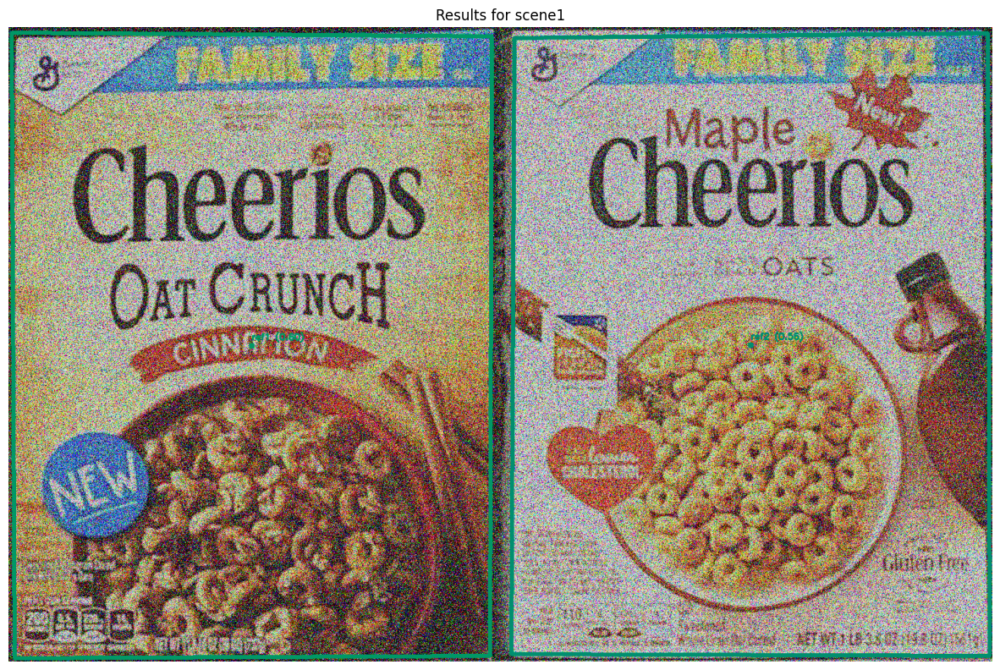


Results for scene2:
Product ref5 - 1 instance found:
  Instance 1 {position: (1527, 448), width: 294px, height: 442px}
  Matches: 111/304
Product ref3 - 1 instance found:
  Instance 1 {position: (305, 492), width: 318px, height: 493px}
  Matches: 106/259


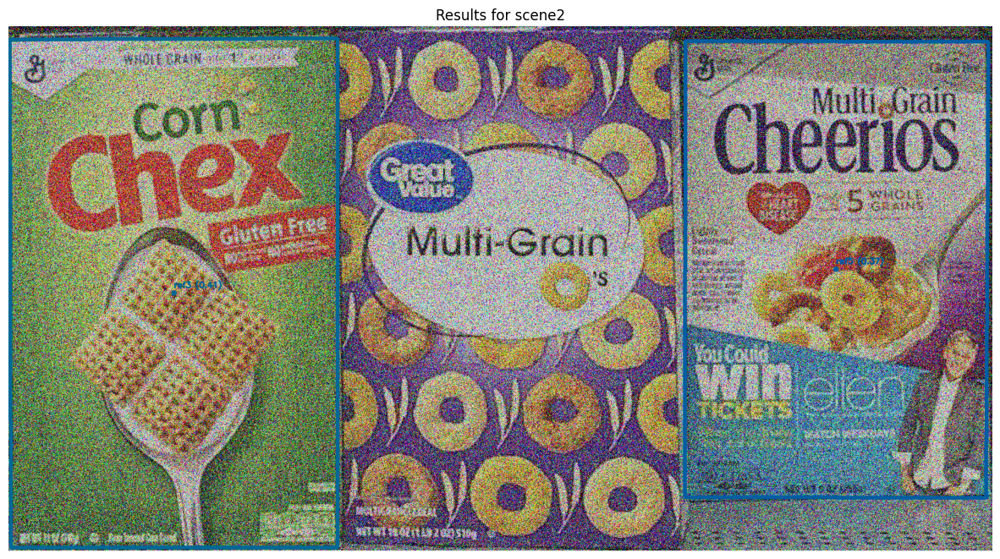


Results for scene3:
Product ref6 - 1 instance found:
  Instance 1 {position: (297, 457), width: 315px, height: 352px}
  Matches: 93/224
Product ref7 - 1 instance found:
  Instance 1 {position: (886, 459), width: 288px, height: 345px}
  Matches: 77/245
Product ref8 - 1 instance found:
  Instance 1 {position: (1446, 398), width: 294px, height: 408px}
  Matches: 97/222


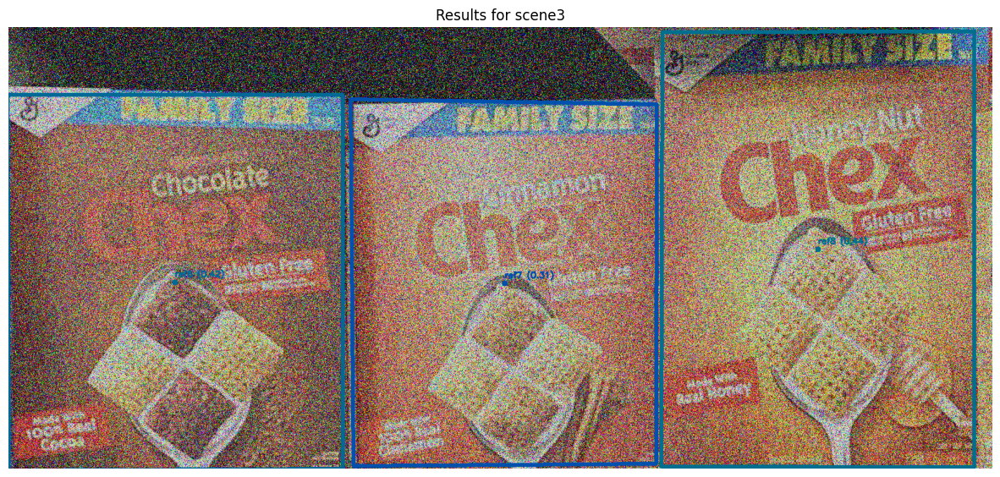


Results for scene4:
Product ref1 - 1 instance found:
  Instance 1 {position: (886, 913), width: 201px, height: 271px}
  Matches: 113/228
Product ref8 - 1 instance found:
  Instance 1 {position: (350, 257), width: 183px, height: 258px}
  Matches: 33/117


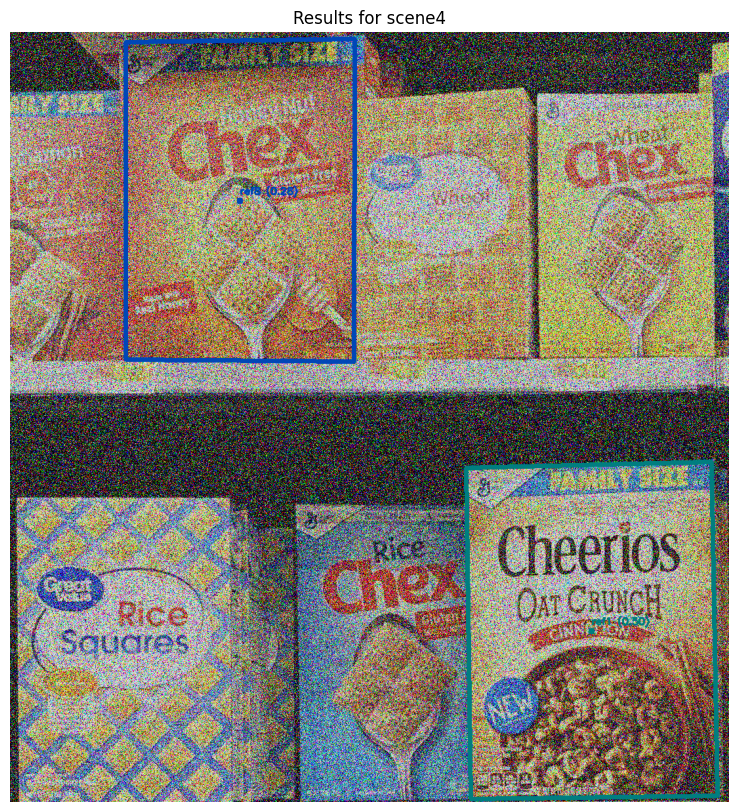


Results for scene5:
Product ref11 - 1 instance found:
  Instance 1 {position: (370, 752), width: 193px, height: 295px}
  Matches: 64/192
Product ref12 - 1 instance found:
  Instance 1 {position: (712, 741), width: 232px, height: 345px}
  Matches: 44/138


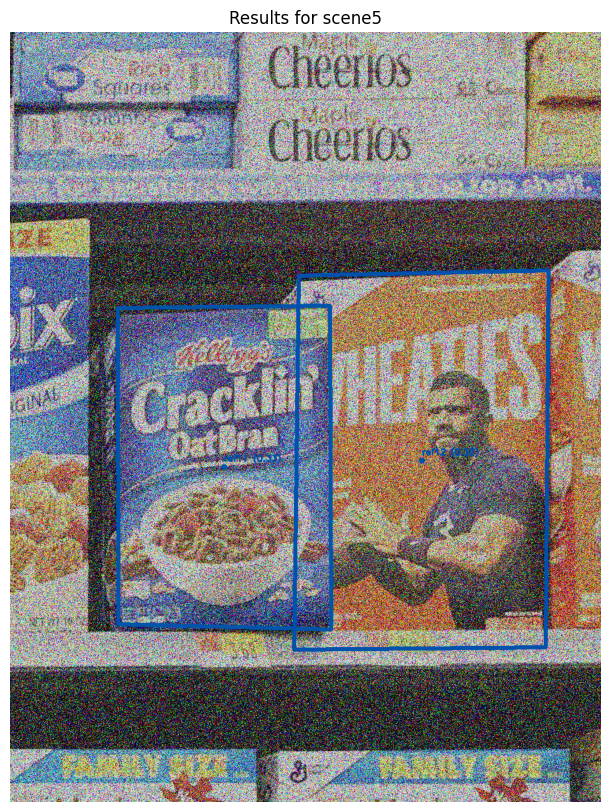

In [59]:
dataset_path = "./dataset/Track A"
results = run_detection(dataset_path)